<a href="https://colab.research.google.com/github/Georgemoralex/Data-Science-and-AI/blob/main/downsampling_revisited_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Reto: Predicción de cancelaciones de hotel.

Los datos de cancelaciones de reservaciones en un hotel, tiene un fuerte desbalance. Hay mucho menos cancelaciones, que cancelaciones, lo cual tiene sentido, de otra manera mejor cerramos el hotel =). El desbalance es medianamente grande que sí no se aplican medidas para tratar este problema, no importa que tan bueno sea tu algoritmo muy probablemente no va a lograr detectar los casos en los que sí se van a cancelar las reservaciones, que es la clase que nos interesa. Nos interesa porque como hotel, lo que quisieramos es evitar tener cuartos vacios a lo largo del año, es preferible invertir un poco más de dinero para influir en los clientes que quieren cancelar para que no cancelen. Puedes implementar alguna camapaña para promover o emocionar a los clientes para que vengan, pero primero es necesario identificar de manera sistemática quiénes serán. No quieres enviarle a todo mundo una camapaña porque te cuesta dinero (supón que les regalas una noche extra o una cena, etc).

En este cuaderno, les muestro la manera en la que pueden aplicar downsampling, que consiste en igualar el número de observaciones de la clase mayoritaria al número de observaciones de la clase minoritaria. Para hacer esto hay que sacar muestras aleatorias sin reemplazo. Con esto vamos a lograr un conjunto balanceado en el que nuestros algorítmos se desempeñaran mejor.

## Setup del ambiente de trabajo en Google Colab.

* Para que puedas reproducir los códigos de la clase es importante que fijes las librerías de Python en tu cuaderno de Colab a aquellas que se utilizaron en clase.
* Recuerda que el software evoluciona todo el tiempo y que si no fijamos las librerías de nuestro proyecto corremos el riesgo de que se rompa el código en el futuro.
* El Google Colab instala por lo general las últimas versiones de las librerías.

In [1]:
# Instalar última versión de yellowbrick y sklearn
!pip install numpy==1.20.3 pandas==1.2.4 yellowbrick==1.3.post1 scikit-learn==0.24.2 ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 23.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 92.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 73.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (pyproject.toml) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

In [2]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.5/393.5 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 38.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 48.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=54150665ed1efce9bdf40980ef2aee5834a6541869993932faadfffcbea6a1a3
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


* Una vez que ejecutes este código reinicia el Kernel de la sesión.
* Comenta este código y comienza a ejecutar el código.

In [3]:
# Liberías estandar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Funciones de Scikit-Learn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import (
    RandomizedSearchCV,
    train_test_split
)

from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix
)

# Funciones de Yellow Brick
from yellowbrick.target import ClassBalance
from yellowbrick.model_selection import (ValidationCurve, FeatureImportances)
from yellowbrick.classifier.threshold import DiscriminationThreshold
from yellowbrick.classifier import (
    ConfusionMatrix,
    ClassPredictionError,
    ClassificationReport,
    PrecisionRecallCurve,
    ROCAUC,
    ClassPredictionError
)

# Importar xgboost
import xgboost as xgb

# Configurar visualizaciones
sns.set_theme(style="whitegrid")
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999

%matplotlib inline

* Si configuraste bien el ambiente de trabajo de tu Google Colab no deberías de tener problema para importar las librerías del curso y ejecutar el código visto en clase.

## Cargar los datos

Cargamos los datos. Nuestra variable a predecir es `is_canceled`. (1) es cancelada y (0) no cancelada.

In [4]:
# https://github.com/rfordatascience/tidytuesday/tree/master/data/2020/2020-02-11
tbl_data = (
    # Read data from the internet
    pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-02-11/hotels.csv")
)

In [5]:
tbl_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


## Análisis Exploratorio de Datos (EDA)

* Aqui hay un análisis exploratorio de datos para entender los datos.
* Revísalo cuidadosamente para entender que tienen los datos.

Este reporte se construye con una librería que se llama `pandas_profiling`. Automatiza muchas gráficas y tablas resumen que se usan en los EDA. es útil como herramienta, pero en la práctica no es suficiente, hay que seguir explorando los datos con mayor detalle. Para este proyecto es suficiente y un buen punto de partida. Si quieres conocer más puedes checar la [documentación](https://pypi.org/project/pandas-profiling/).

In [6]:
# En Google Colab ejecuta esta celda una sola vez. Después de instalar y reiniciar
# la sesión puedes comentar esta linea.
from ydata_profiling import ProfileReport
profile=ProfileReport(tbl_data, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Checar el desbalance en los datos.

In [7]:
(tbl_data
     .groupby(['is_canceled'])
     .size()
     .reset_index(name = 'n_reservaciones')
     .assign(pct = lambda df_: df_.n_reservaciones / df_.n_reservaciones.sum() * 100)
     .round(1)
)

,is_canceled,n_reservaciones,pct
0,0,75166,63.0
1,1,44224,37.0


[]

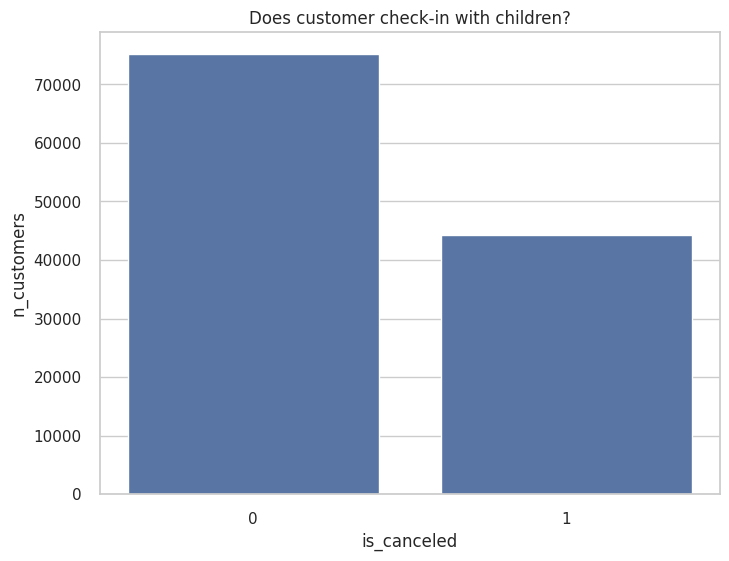

In [8]:
fig, ax = plt.subplots(figsize = (8, 6))
sns.barplot(
    data = (tbl_data
            .groupby(['is_canceled'])
            .size()
            .reset_index(name = 'n_customers')),
    x = 'is_canceled',
    y = 'n_customers'
)
plt.title("Does customer check-in with children?")
plt.plot()

## Corregir desbalance con downsampling

* Construimos una función para hacer el downsampling, lo único que necesitas es pandas.
* Probablemente, no conozcas lo que hace `query`, es una función que encadenas a un pandas dataframe y te permite filtrar las filas (checa la [documentación](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html)).
* La función `sample` te permite encadenarla a un pandas dataframe y sacar filas de manera aleatoria (checa la [documentación](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sample.html)).

In [9]:
def fun_downsample(tbl):
    '''
    Función para hacer downsampling
    tbl: Son los datos originales en forma de dataframe.
    '''
    # Filtramos la clase mayoritaria y sacamos de manera aleatoria N observaciones.
    # N es igual al número de observaciones en la clase minoritaria.
    # Observa que fijo una semilla en el random_state para garantizar reproducibilidad.
    tbl_reservations_not_cancelled = (
        tbl
            .query('is_canceled == 0')
            .sample(
                n = tbl.groupby(['is_canceled']).size()[1],
                random_state=42)
    )
    # Filtramos la clase minoritaria.
    tbl_reservations_cancelled = tbl.query('is_canceled == 1')

    return pd.concat([
        tbl_reservations_not_cancelled,
        tbl_reservations_cancelled
    ])

tbl_downsampled_data = fun_downsample(tbl_data)

* Observa como igualamos las proporciones de las clases a 50:50
* Desde luego que perdemos mucha información, sin embargo, el costo no es superior al beneficio.
* El beneficio será que nuestro algorítmo será capaz de atrapar más verdaderos positivos que sin debalance.
* Puede haber casos en los que esto no funcioné y tengamos que aplicar otra distribución, pero por ahora lo dejamos así.

In [10]:
(tbl_downsampled_data
     .groupby(['is_canceled'])
     .size()
     .reset_index(name = 'n_reservaciones')
     .assign(pct = lambda df_: df_.n_reservaciones / df_.n_reservaciones.sum() * 100)
     .round(1)
)

,is_canceled,n_reservaciones,pct
0,0,44224,50.0
1,1,44224,50.0


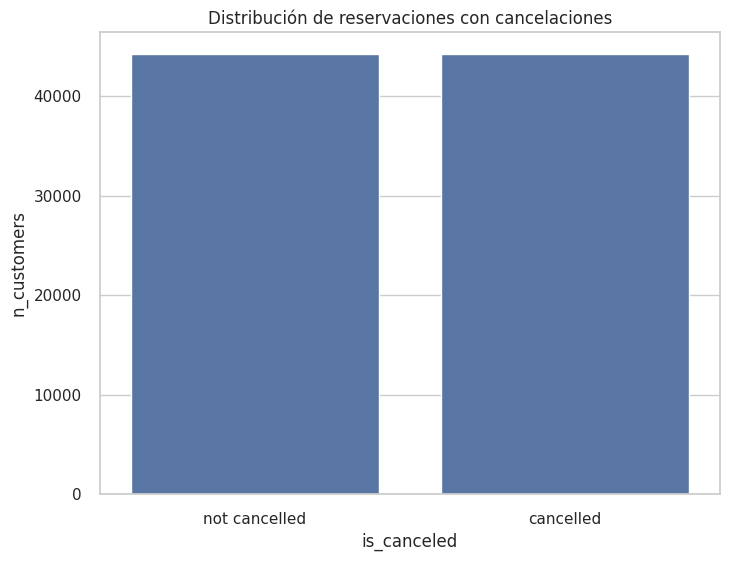

In [11]:
fig, ax = plt.subplots(figsize = (8, 6))
sns.barplot(
    data = (tbl_downsampled_data
            .groupby(['is_canceled'])
            .size()
            .reset_index(name = 'n_customers')
            .assign(is_canceled = lambda df_: df_.is_canceled.replace({0: 'not cancelled', 1: 'cancelled'}))),
    x = 'is_canceled',
    y = 'n_customers'
)
plt.title("Distribución de reservaciones con cancelaciones")
plt.show()

## Construimos los conjuntos de entrenamiento

* Observa que para construir los conjuntos de entrenamiento y prueba usamos `tbl_downsampled_data` los nuevos datos y no `tbl_data` que son los datos originales.

In [15]:
from sklearn.model_selection import train_test_split

y = tbl_downsampled_data.is_canceled
X = tbl_downsampled_data.drop(columns = 'is_canceled')

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42
)

In [13]:
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')

X_train shape: (70758, 31)
y_train shape: (70758,)


In [14]:
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_test shape: (17690, 31)
y_test shape: (17690,)


## A partir de aqui puedes seguir el flujo de ML que hemos visto en clase ...

* Dado que lo que queremos es resolver un problema de clasificar cada reservación como cancelada y no cancelada, lo que queremos construir es un modelo de aprendizaje supervisado para clasificación.

* Aqui tienes que ejecutar el código visto en la clase asíncrona del Profundiza.

### Paso 1. Selecciona y extrae las características de tu modelo.

* Recuerda que tienes que aplicar tus transfomaciones y selección de variables tanto al conjunto de entrenamiento como al conjunto de prueba. Tu elige como hacerlo.

* Con lo único que tienes que tener cuidado es con las variables categóricas que tienen muchas clases, porque puede ser que al momento de convertirlas en dummies no tengas el mismo número de columnas o tengas columnas diferentes. TIP: No uses `pd.get_dummies()` utiliza `OneHotEncoder` de `scikit-learn`. Puedes ir a la grabación de la segunda clase síncrona para ver la discusión que tuvimos en clase.

* TIP: Toma el código que vimos en la segunda clase, que ya implementa el OneHotEncoder y modifica, lo que tengas que modificar.

* TIP: No selecciones la variable de `reservation_status`, porque si observas en el EDA, es lo mismo que la variable `is_cancelled`. No entrenas un modelo pasándole la respuesta, obvio va a sacar score perfecto. Por eso es muy importante que revises el análisis exploratorio de los datos y no metas todo a la licuadora.

In [17]:
print("Columnas en X_train:", X_train.columns)
print("Columnas en X_test:", X_test.columns)

Columnas en X_train: Index(['hotel', 'lead_time', 'arrival_date_year', 'arrival_date_month',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')
Columnas en X_test: Index(['hotel', 'lead_time', 'arrival_date_year', 'arrival_date_month',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_seg

In [28]:
from sklearn.preprocessing import OneHotEncoder

variable_selection_categoric = [
    'hotel', 'arrival_date_month', 'meal', 'country', 'market_segment',
    'distribution_channel', 'reserved_room_type', 'assigned_room_type',
    'deposit_type', 'customer_type'
]

variable_selection_numeric = [
    'lead_time', 'arrival_date_year', 'arrival_date_week_number',
    'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights',
    'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations',
    'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
    'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests'
]

def prep_for_ml(tbl_train, tbl_test):
    '''Limpia X_train y X_test:
        1) Selecciona variables numéricas y categóricas.
        2) Convierte variables categóricas en One Hot Encoding.
        3) Une los DataFrames procesados.
    '''
    # Variables numéricas
    tbl_num_train = tbl_train.loc[:, variable_selection_numeric]
    tbl_num_test = tbl_test.loc[:, variable_selection_numeric]

    # Variables categóricas
    tbl_cat_train = tbl_train.loc[:, variable_selection_categoric]
    tbl_cat_test = tbl_test.loc[:, variable_selection_categoric]

    # Llenar valores NaN con "Other"
    tbl_cat_train = tbl_cat_train.fillna("Other")
    tbl_cat_test = tbl_cat_test.fillna("Other")

    # Asegurar que X_test solo contenga categorías presentes en X_train
    for col in variable_selection_categoric:
        categorias_entrenamiento = set(tbl_cat_train[col].unique())  # Categorías de X_train
        tbl_cat_test[col] = tbl_cat_test[col].apply(lambda x: x if x in categorias_entrenamiento else "Other")

    # One Hot Encoding con handle_unknown='ignore'
    ohe = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
    ohe.fit(tbl_cat_train)
    col_names = ohe.get_feature_names_out(variable_selection_categoric)

    # Transformar los datos categóricos
    tbl_ohe_cat_train = pd.DataFrame(
        ohe.transform(tbl_cat_train), columns=col_names, index=tbl_train.index
    )

    tbl_ohe_cat_test = pd.DataFrame(
        ohe.transform(tbl_cat_test), columns=col_names, index=tbl_test.index
    )

    # Unir variables numéricas y categóricas transformadas
    tbl_train_clean = pd.concat([tbl_num_train, tbl_ohe_cat_train], axis=1)
    tbl_test_clean = pd.concat([tbl_num_test, tbl_ohe_cat_test], axis=1)

    return tbl_train_clean, tbl_test_clean

# Llamar a la función con los datos corregidos
X_train_clean, X_test_clean = prep_for_ml(X_train, X_test)



* Estas líneas nos sirven para validar que las columnas de los tres conjuntos de datos después de aplicar el preprocesamiento están correctas.
* Si genera error es porque no tienes las mismas columnas, puedes investigar por qué?

Las columnas dentro de la variable de selección numérica y categórica no coincidian con las columnas de las variables en los sets de entrenamiento y prueba, por lo que se revisaron las columnas que estaban incluidas en estas variables y se ajustaron las variables en donde seleccionamos las numéricas y las categóricas.

* **HINT: Los errores en el código son comúnes, y están diseñados para decirte que es lo que está fallando. Cómo cientifico de datos, pasas una parte importante debuggeando código. Si tienes un error que no entiendes, lo copias y pegas en Google y puedes investigar que dice la comunidad y cómo se resuelve. O puedes preguntar.**

In [29]:
assert prep_for_ml(X_train, X_test)[0].columns.tolist() == prep_for_ml(X_train, X_test)[1].columns.tolist()

### Paso 2: Construye un modelo base

* Construye un modelo sencillo. Recuerda que estas viendo problemas de clasificación, por lo que tienes que escoger la implementación correcta. Por ejemplo:
    - [LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn.linear_model.LogisticRegression)
    - [Support Vector Classification (SVC¶)](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC)
    - [K nearest neighbors (KNeighborsClassifier¶)](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier)
    - [Decision Trees (DecisionTreeClassifier)](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier)
    - [Random Forest (RandomForestClassifier)](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn.ensemble.RandomForestClassifier)
    - [Xgboost (XGBClassifier)](https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier)
    
* Entrena el modelo y calcula la métricas de error para un problema de clasificación: precision, recall, f1 score, y la matriz de confusión. Utiliza las funciones de yellowbrick que vimos en clase.

* Analiza los resultados, que implica para el hotel.

¿Qué dicen los Falsos Negativos, Falsos Positivos?

Falsos Positivos (922):

Son reservas que el modelo predijo como canceladas, pero que en realidad no se cancelaron.
Impacto en el hotel:
Puede hacer que el hotel libere habitaciones innecesariamente.
Se pueden perder ingresos si las habitaciones se reasignan o si se hacen descuentos para evitar cancelaciones cuando en realidad el cliente sí planeaba llegar.

Falsos Negativos (1080):

Son reservas que el modelo predijo como no canceladas, pero que en realidad sí se cancelaron.
Impacto en el hotel:
Riesgo de sobreventa: El hotel puede contar con reservas que finalmente no llegan.

¿Qué implica una precision o recall de X en la operación del hotel utilizando tu modelo?

Alta precisión (0.8936) significa que cuando el modelo predice una cancelación, casi el 89.36% de las veces tiene razón.

Impacto: El hotel puede tomar medidas preventivas con mayor confianza en los casos de cancelación, como re-vender la habitación o contactar al cliente para confirmar la reserva.

Alto recall (0.8776) significa que el modelo es capaz de identificar el 87.76% de todas las cancelaciones reales.

Impacto: Se logra prevenir la mayoría de las cancelaciones, pero aún hay un 12.24% que el modelo no detecta.
Si el recall fuera muy bajo, el hotel no podría tomar acciones preventivas suficientes, pero con este recall alto, se pueden aplicar estrategias de gestión de cancelaciones.

En el siguiente paso optimizaremos los hiperparámetros del modelo para tratar de mejorar estos resultados.

Precision: 0.8936
Recall: 0.8776
F1-score: 0.8856


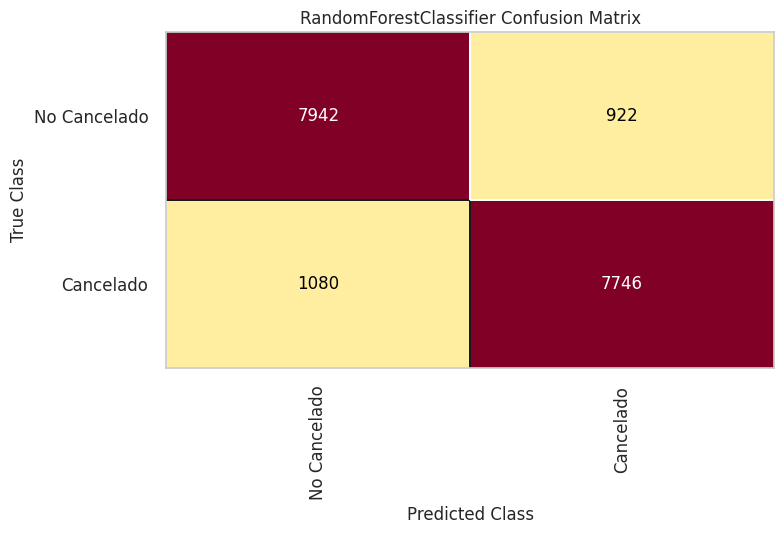

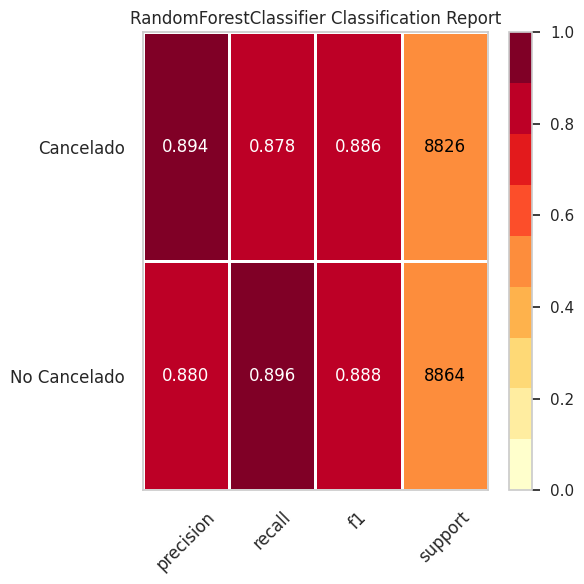

<Axes: title={'center': 'RandomForestClassifier Classification Report'}>

In [40]:
# Asegurar que X_test_clean tenga nombres de columna
X_test_clean = pd.DataFrame(X_test_clean, columns=X_train_clean.columns)

# Convertir ambos conjuntos a NumPy
X_train_np = X_train_clean.values
X_test_np = X_test_clean.values

# Definir y entrenar modelo base con NumPy
model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced")
model.fit(X_train_np, y_train)

# Predicciones
y_pred = model.predict(X_test_np)

# Calcular métricas de clasificación
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Imprimir métricas
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")

# Visualización de la Matriz de Confusión con Yellowbrick
cm_viz = ConfusionMatrix(RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"),
                         classes=["No Cancelado", "Cancelado"])
cm_viz.fit(X_train_np, y_train)  # Permitir que Yellowbrick entrene el modelo
cm_viz.score(X_test_np, y_test)
cm_viz.show()

# Reporte de Clasificación con Yellowbrick
plt.figure(figsize=(6, 6))
cr_viz = ClassificationReport(RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"),
                              classes=["No Cancelado", "Cancelado"], support=True)
cr_viz.fit(X_train_np, y_train)  # Permitir que Yellowbrick entrene el modelo
cr_viz.score(X_test_np, y_test)
cr_viz.show()

### Paso 3: Busca los mejores hiperparámetros de tu modelo

* Para esto puedes utilizar el `GridSearch` o el `RandomSearch`, tu elige la implementación que quiras, solo ten cuidado con los parámetros que les tienes que pasar porque hay sutilezas. Tienes los códigos de las clases y la documentación como referencia.

* Escoge los hiperparámetros correctos. TIP: Puedes tomar como referencia la tabla del libro que les pasé por correo de Canvas. Puedes ajustar los rangos de los hiperparámetros según los resultados que observes.

* Calcula los las mismas métricas que sacaste en el modelo base, ¿mejoraron los resultados?

### Paso 4: Prueba con otro modelo y ajusta sus hiperparámetros como en el paso 3.

### Paso 5: Selecciona el mejor modelo y calcula las predicciones

* Utiliza el mejor modelo para calcular las predicciones utiliznado el conjunto de prueba.
    - Predice la clase
    - Predice la probabilidad de cancelación
* Grafica la curva ROC del mejor modelo.
* Reporta la precision y el recall.
* Interpreta los resultados en función de lo que estos implican pra el modelo si utilizan tu modelo.

### Paso 5: Genera un CSV con tus predicciones para compartir con el hotel, utilizando tu mejor modelo entrenado con los datos de prueba.

* Reporta en tu CSV la predicción de la clase y la predicción de la probabilidad de cancelación.

## Nota:

* Si tienes dudas pregunta.